In [3]:
import warnings 
import numpy as np
import pandas as pd
import os
import seaborn as sns
import statsmodels.api as sm
from matplotlib import pyplot as plt
from matplotlib.ticker import PercentFormatter
import matplotlib.ticker as ticker
from scipy import stats
from pylab import rcParams
from matplotlib.pyplot import MultipleLocator

rcParams['figure.figsize'] = (20, 8)
sns.set_style('darkgrid')
plt.style.use('seaborn-darkgrid')

from sklearn import datasets
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from  sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import ShuffleSplit
from sklearn.metrics import accuracy_score
from sklearn.utils import resample
from sklearn.tree import export_graphviz
from IPython.display import Image 
from sklearn.datasets import make_hastie_10_2
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from patsy import dmatrices
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn import tree, metrics
from sklearn import preprocessing

from sklearn.tree import DecisionTreeClassifier 
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.metrics import mean_squared_error,accuracy_score, precision_score,recall_score,f1_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_curve, f1_score, auc, confusion_matrix
import time
from sklearn.metrics import roc_auc_score
from matplotlib.colors import ListedColormap
from sklearn import neighbors, datasets
from sklearn import preprocessing
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import Lasso, Ridge, RidgeClassifier
import itertools
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor

from numpy import int64
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from math import sqrt

In [4]:
returns_split = pd.read_csv('Returns_updated.csv', encoding='latin-1')

In [17]:
returns_split

,Exit Date_x,Exit Type_x,VC Round Stock Type,VC Deal Size (millions),Time Since VC Round,VC Round Close Date,Payout,Return MOIC,Industry Sector,Industry Group,...,Internet of Things,LOHAS & Wellness,Marketing Tech,Mobile,Mobile Commerce,Mobility Tech,Robotics and Drones,SaaS,Supply Chain Tech,TMT
0,27,0,2,7.000001,14.728767,90,157.53582,32.60251,2,5,...,False,False,False,False,False,False,False,True,False,True
1,27,0,3,7.000001,14.728767,90,157.53582,21.54688,2,5,...,False,False,False,False,False,False,False,True,False,True
2,27,0,4,11.000000,10.476712,147,139.81700,18.23574,2,5,...,False,False,False,False,False,False,False,True,False,True
3,27,0,5,11.000000,10.476712,147,139.81700,18.23574,2,5,...,False,False,False,False,False,False,False,True,False,True
4,27,0,6,11.000000,10.476712,147,139.81700,18.23574,2,5,...,False,False,False,False,False,False,False,True,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
240,53,2,2,4.265839,0.997260,86,157.82328,14.20349,0,0,...,False,False,False,False,False,False,False,True,False,True
241,59,1,2,9.000000,6.221918,19,2227.12000,247.45800,2,5,...,False,False,False,True,False,False,False,True,False,True
242,59,1,3,6.535750,5.567123,210,858.45700,131.34800,2,5,...,False,False,False,True,False,False,False,True,False,True
243,59,1,4,29.999982,4.202740,81,1140.83000,38.02780,2,5,...,False,False,False,True,False,False,False,True,False,True


In [5]:
returns_split.isnull().sum()

Company PBID                                  0
Exit Date_x                                   0
Exit Type_x                                   0
VC Round Stock Type                           0
VC Deal Size (millions)                       0
Time Since VC Round                           0
VC Round Close Date                           0
Payout                                        0
Return %                                      0
Return MOIC                                   0
Industry Sector                               0
Industry Group                                0
Industry Code                                 0
State                                         0
City                                          0
Country                                       0
3D Printing                                   0
Advanced Manufacturing                        0
Artificial Intelligence & Machine Learning    0
Big Data                                      0
CloudTech & DevOps                      

In [6]:
#You can look at summary of numerical fields by using describe() function
returns_split.describe().round()

,VC Deal Size (millions),Time Since VC Round,Payout,Return %,Return MOIC
count,245.0,245.0,245.0,245.0,245.0
mean,20.0,4.0,165.0,15.0,18.0
std,31.0,3.0,269.0,39.0,39.0
min,0.0,0.0,0.0,-1.0,0.0
25%,4.0,2.0,33.0,2.0,3.0
50%,10.0,4.0,121.0,9.0,11.0
75%,20.0,6.0,144.0,14.0,16.0
max,251.0,17.0,2227.0,446.0,447.0


In [7]:
returns_split.describe(include=[object])

,Company PBID,Exit Date_x,Exit Type_x,VC Round Stock Type,VC Round Close Date,Industry Sector,Industry Group,Industry Code,State,City,Country
count,245,245,245,245,245,245,245,245,245,245,245
unique,100,95,4,10,221,3,6,15,18,45,4
top,40452-67,4/18/2019,Merger/Acquisition,Series A,6/12/2006,Information Technology,Software,Business/Productivity Software,California,San Francisco,United States
freq,8,9,159,79,3,238,211,73,146,55,236


In [8]:
# Encoding
encode=LabelEncoder()
catcol = ['Company PBID','Exit Date_x','Exit Type_x', 'VC Round Stock Type','VC Round Close Date','Industry Sector',
         'Industry Group','Industry Code','State','City','Country']
returns_split[catcol] = returns_split[catcol].apply(encode.fit_transform)
returns_split=returns_split.drop(['Return % ','Company PBID'],axis = 1)

In [9]:
returns_split.dtypes

Exit Date_x                                     int64
Exit Type_x                                     int64
VC Round Stock Type                             int64
VC Deal Size (millions)                       float64
Time Since VC Round                           float64
VC Round Close Date                             int64
Payout                                        float64
Return MOIC                                   float64
Industry Sector                                 int64
Industry Group                                  int64
Industry Code                                   int64
State                                           int64
City                                            int64
Country                                         int64
3D Printing                                      bool
Advanced Manufacturing                           bool
Artificial Intelligence & Machine Learning       bool
Big Data                                         bool
CloudTech & DevOps          

In [10]:
X = returns_split.drop(columns='Return MOIC ')
y = returns_split['Return MOIC ']

In [11]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state= 21)

In [12]:
import xgboost as xgb
xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', learning_rate = 0.4,
                max_depth = 25, alpha = 8, n_estimators = 200)
xg_reg.fit(X_train,y_train)
y_pred = xg_reg.predict(X_test)

In [13]:
RMSE = sqrt(mean_squared_error(y_test , y_pred))
R2 = r2_score(y_test , y_pred)
print("RMSE of Model is    : {:.2f}"
          .format(RMSE))
print("R-square of Model is : {:.4f}"
      . format(R2))

RMSE of Model is    : 21.61
R-square of Model is : 0.5531


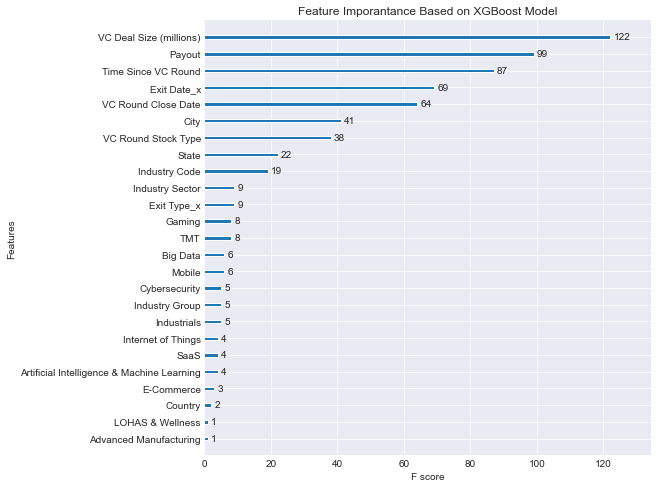

In [15]:
xgb.plot_importance(xg_reg)
plt.rcParams['figure.figsize'] = [8, 8]
plt.title("Feature Imporantance Based on XGBoost Model")
plt.show()

In [18]:
# One-hot encode the data using pandas get_dummies
features = pd.get_dummies(returns_split)
# Display the first 5 rows of the last 12 columns
features.iloc[:,5:].head(5)

,VC Round Close Date,Payout,Return MOIC,Industry Sector,Industry Group,Industry Code,State,City,Country,3D Printing,...,Internet of Things,LOHAS & Wellness,Marketing Tech,Mobile,Mobile Commerce,Mobility Tech,Robotics and Drones,SaaS,Supply Chain Tech,TMT
0,90,157.53582,32.60251,2,5,2,7,25,3,False,...,False,False,False,False,False,False,False,True,False,True
1,90,157.53582,21.54688,2,5,2,7,25,3,False,...,False,False,False,False,False,False,False,True,False,True
2,147,139.81700,18.23574,2,5,2,7,25,3,False,...,False,False,False,False,False,False,False,True,False,True
3,147,139.81700,18.23574,2,5,2,7,25,3,False,...,False,False,False,False,False,False,False,True,False,True
4,147,139.81700,18.23574,2,5,2,7,25,3,False,...,False,False,False,False,False,False,False,True,False,True


In [20]:
# Use numpy to convert to arrays
import numpy as np
# Labels are the values we want to predict
labels = np.array(returns_split['Return MOIC '])
# Remove the labels from the features
# axis 1 refers to the columns
features= returns_split.drop('Return MOIC ', axis = 1)
# Saving feature names for later use
feature_list = list(returns_split.columns)
# Convert to numpy array
features = np.array(returns_split)

In [21]:
X = returns_split.drop(columns=['Return MOIC '])
y = returns_split['Return MOIC ']

In [22]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state= 21)

In [23]:
print (X_train.shape, y_train.shape)
print (X_test.shape, y_test.shape)
X

(171, 33) (171,)
(74, 33) (74,)


,Exit Date_x,Exit Type_x,VC Round Stock Type,VC Deal Size (millions),Time Since VC Round,VC Round Close Date,Payout,Industry Sector,Industry Group,Industry Code,...,Internet of Things,LOHAS & Wellness,Marketing Tech,Mobile,Mobile Commerce,Mobility Tech,Robotics and Drones,SaaS,Supply Chain Tech,TMT
0,27,0,2,7.000001,14.728767,90,157.53582,2,5,2,...,False,False,False,False,False,False,False,True,False,True
1,27,0,3,7.000001,14.728767,90,157.53582,2,5,2,...,False,False,False,False,False,False,False,True,False,True
2,27,0,4,11.000000,10.476712,147,139.81700,2,5,2,...,False,False,False,False,False,False,False,True,False,True
3,27,0,5,11.000000,10.476712,147,139.81700,2,5,2,...,False,False,False,False,False,False,False,True,False,True
4,27,0,6,11.000000,10.476712,147,139.81700,2,5,2,...,False,False,False,False,False,False,False,True,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
240,53,2,2,4.265839,0.997260,86,157.82328,0,0,7,...,False,False,False,False,False,False,False,True,False,True
241,59,1,2,9.000000,6.221918,19,2227.12000,2,5,3,...,False,False,False,True,False,False,False,True,False,True
242,59,1,3,6.535750,5.567123,210,858.45700,2,5,3,...,False,False,False,True,False,False,False,True,False,True
243,59,1,4,29.999982,4.202740,81,1140.83000,2,5,3,...,False,False,False,True,False,False,False,True,False,True


In [34]:
# import the regressor 
from sklearn.ensemble import RandomForestRegressor 
  
 # create regressor object 
regressor1 = RandomForestRegressor(n_estimators = 100, random_state = 10, max_depth=10) 
  
# fit the regressor with x and y data 
regressor1.fit(X_train, y_train) 
# Use the forest's predict method on the test data
predictions = regressor1.predict(X_test)
# Calculate the absolute errors
errors = abs(predictions - y_test)

In [35]:
# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test)
# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')
print('Random Forest Accuracy of Returns by series:', round(accuracy, 2), '%.')

Mean Absolute Error: 8.07 degrees.
Random Forest Accuracy of Returns by series: 14.39 %.


In [27]:
# Get numerical feature importances
importances = list(regressor1.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: Payout               Importance: 0.4
Variable: VC Deal Size (millions) Importance: 0.23
Variable: Time Since VC Round  Importance: 0.18
Variable: VC Round Stock Type  Importance: 0.06
Variable: Exit Date_x          Importance: 0.04
Variable: VC Round Close Date  Importance: 0.04
Variable: State                Importance: 0.02
Variable: Exit Type_x          Importance: 0.01
Variable: Industry Group       Importance: 0.01
Variable: Industry Code        Importance: 0.01
Variable: Robotics and Drones  Importance: 0.01
Variable: Return MOIC          Importance: 0.0
Variable: Industry Sector      Importance: 0.0
Variable: City                 Importance: 0.0
Variable: Country              Importance: 0.0
Variable: 3D Printing          Importance: 0.0
Variable: Advanced Manufacturing Importance: 0.0
Variable: Artificial Intelligence & Machine Learning Importance: 0.0
Variable: Big Data             Importance: 0.0
Variable: CloudTech & DevOps   Importance: 0.0
Variable: Cybersecurity

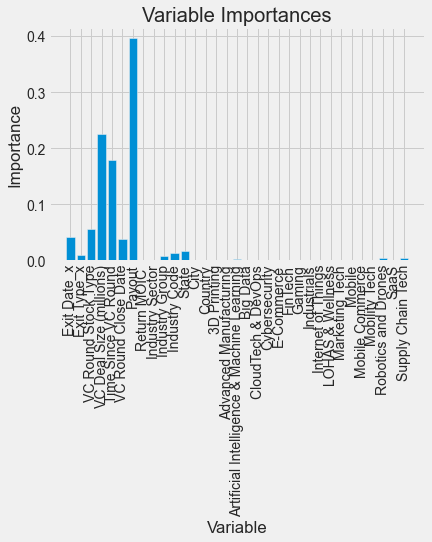

In [28]:
# Import matplotlib for plotting and use magic command for Jupyter Notebooks
import matplotlib.pyplot as plt
%matplotlib inline
# Set the style
plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(importances)))
# Make a bar chart
plt.bar(x_values, importances, orientation = 'vertical')
# Tick labels for x axis
plt.xticks(x_values, feature_list, rotation='vertical')
# Axis labels and title
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

In [36]:
from sklearn.tree import export_graphviz

def display_estimator(estimator, feat_names):
    # Export as dot file
    export_graphviz(estimator, out_file='tree.dot', 
                    feature_names=feat_names,
                    rounded = True, proportion = False, 
                    precision = 2, filled = True)

    # Convert to png using system command (requires Graphviz)
    from subprocess import call
    call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

    # Display in jupyter notebook
    from IPython.display import Image
    display(Image(filename = 'tree.png'))

In [37]:
display_estimator(regressor1.estimators_[4], X.columns)